In [1]:
#import Pkg; Pkg.add("LaTeXStrings")
#import Pkg; Pkg.add("Measures")
#import Pkg; Pkg.add("PythonPlot")

In [2]:
using Random
using LinearAlgebra
using Plots
using Statistics
using LaTeXStrings
using Measures


#Plots.scalefontsizes(1.5)
Plots.default(guidefontsize = 20, tickfontsize = 12, legendfontsize = 18)
#gr(legendfontsize = 10)

In [3]:
# Set random seed for reproducibility
Random.seed!(1234)

TaskLocalRNG()

In [4]:
# Sigmoid function
σ(z) = 1.0 ./ (1.0 .+ exp.(-z))

σ (generic function with 1 method)

In [5]:
# QkL-SGD for L2-regularized logistic regression
function qklsgd_logistic(x0, D, t, k, q, Gset, Oset; η=0.01, λ=1, iters=100, xstar = zeros(size(x0)))
	n_data = size(D, 2)
	n_features = size(D, 1)
	x = x0 # Initialize weights
	
	G_loss_hist = Float64[]
	O_loss_hist = Float64[]
	indices = Int[]
	O_allowed = Int[]
	error = Float64[]

	for i in 1:iters
		# Compute average loss
		eps = 1e-12  # Small constant to avoid log(0)
		that = σ.(D' * x)
		f_vals = - (t .* log.(that .+ eps) + (1 .- t) .* log.(1 .- that .+ eps))  .+ (λ/n_data) * sum(x.^2)
		G_loss = sum(f_vals[Gset])
		if Oset != []
			O_loss = sum(f_vals[Oset])
		else
			O_loss = 0.0  # If Oset is empty, set O_loss to 0
		end
		push!(G_loss_hist, G_loss)
		push!(O_loss_hist, O_loss)
		push!(error,norm(x-xstar)^2)

		# Shuffle data
		samp = shuffle(1:n_data)[1:k] 
		
		qval = quantile(f_vals[samp], q)
		B_inds = findall(f_vals[samp] .<= qval)
		B_set = samp[B_inds]  # Map back to original indices

		push!(O_allowed, length(intersect(B_set, Oset)))  # Count how many indices in B_set are also in Oset
		idx = rand(B_set)
		push!(indices, idx)
		
		di = D[:, idx]
		ti = t[idx]
		pred = σ(x'*di)
		grad = (pred - ti) * di + 2 * (λ/n_data) * x  # Gradient with L2 regularization, excluding bias term
		x -= η * grad

		if i == iters
			print(size(B_set))
		end
	end
	return x, G_loss_hist, O_loss_hist, indices, O_allowed, error
end


function mklsgd_logistic(x0, D, t, k, Gset, Oset; η=0.01, λ=1, iters=100, xstar = zeros(size(x0)))
    q = 1.0/k
    return qklsgd_logistic(x0, D, t, k, q, Gset, Oset, η=η, λ=λ,iters=iters, xstar = xstar)
end

mklsgd_logistic (generic function with 1 method)

In [6]:
x0 = randn(3,)

3-element Vector{Float64}:
 -0.3597289068234817
  1.0872084924285859
 -0.4195896169388487

# No outlier example and $q = 1$, $\alpha = 1$ (checking that this works the same as regular SGD -- it does!)

In [7]:
# Generate linearly separable 2D data
begin
	n_samples = 200
	class_size = Int(n_samples / 2)  # Number of samples per class
	D_pos = randn(2, class_size) .+ [2.0; 2.0]  # Positive class centered at (2,2)
	D_neg = randn(2, class_size) .+ [-2.0; -2.0] # Negative class centered at (-2,-2)

	D = hcat(D_pos, D_neg)
	#D = D ./ norm.(eachcol(D))'
	t = vcat(ones(class_size), zeros(class_size))  # Labels: 1 for positive, 0 for negative

	# Add bias term to features
	D_aug = vcat(ones(1, size(D,2)), D)  # shape (3, 2n)
	Gset = 1:n_samples
	Oset = [];
end

Any[]

In [8]:
# Train model
x, G_loss_hist, O_loss_hist, indices, O_allowed, error = qklsgd_logistic(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000)
mx, mG_loss_hist, mO_loss_hist, mindices, mO_allowed, merror = mklsgd_logistic(x0, D_aug, t, 200, Gset, Oset, iters=10000)

# Plot loss curve
plot(G_loss_hist, xlabel=L"Iteration $t$", ylabel=L"$F(\mathbf{x}_t)$", label=L"SGD", lw=4, dpi=500,margin=5mm)
plot!(mG_loss_hist, label=L"MkLSGD", lw=4)
savefig("figs/logisticregression_loss_0percoutlier.png")

(200,)(1,)

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_0percoutlier.png"

In [9]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label="Positive", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==0], dcomp2[t_plot.==0], marker=:circle, label="Negative", color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	dcomp1_range = -4:0.1:4
	dcomp2_boundary = -(x[1] .+ x[2]*dcomp1_range) ./ x[3]
	plot!(dcomp1_range, dcomp2_boundary, label="SGD", lw=4, color=:black)

	
	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#xlabel!("dcomp1")
	#ylabel!("dcomp2")

	savefig("figs/logisticregression_viz_0percoutlier.png")
end

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_viz_0percoutlier.png"

# Outlier example -- $\beta = 0.01$, $q = 0.99$, $\alpha = 1$

In [10]:
# Generate linearly separable 2D data with $\beta = 0.01$ fraction mislabelled -- in only one class
begin
	# reset labels
	t = vcat(ones(class_size), zeros(class_size))  # Labels: 1 for positive, 0 for negative

	β = 0.01
	O_size = Int(β*n_samples) # Number of mislabelled samples in each class
	t[1:Int(O_size)] .= 0  # Flip first set of positive labels to negative

	Gset = Int(O_size)+1:n_samples
	Oset = 1:Int(O_size);
end

1:2

(198,)(200,)(198,)(1,)

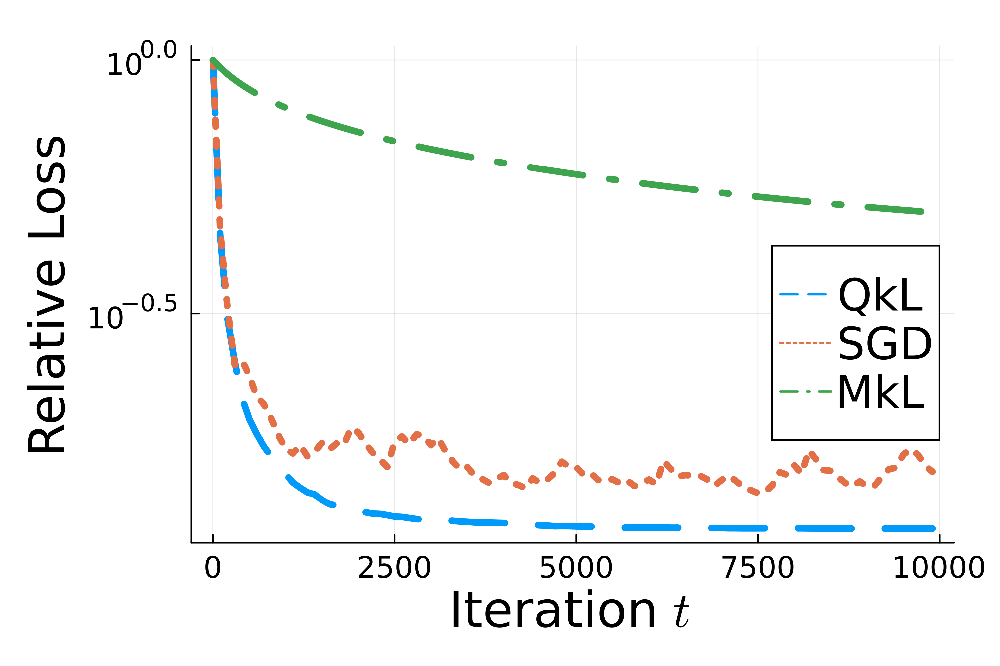

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_1percoutlier.png"

In [11]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_logistic(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_logistic(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_logistic(x0, D_aug, t, 200, 0.99, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_logistic(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10,legend=(0.85,0.5))

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

display(p)
savefig("figs/logisticregression_loss_1percoutlier.png")

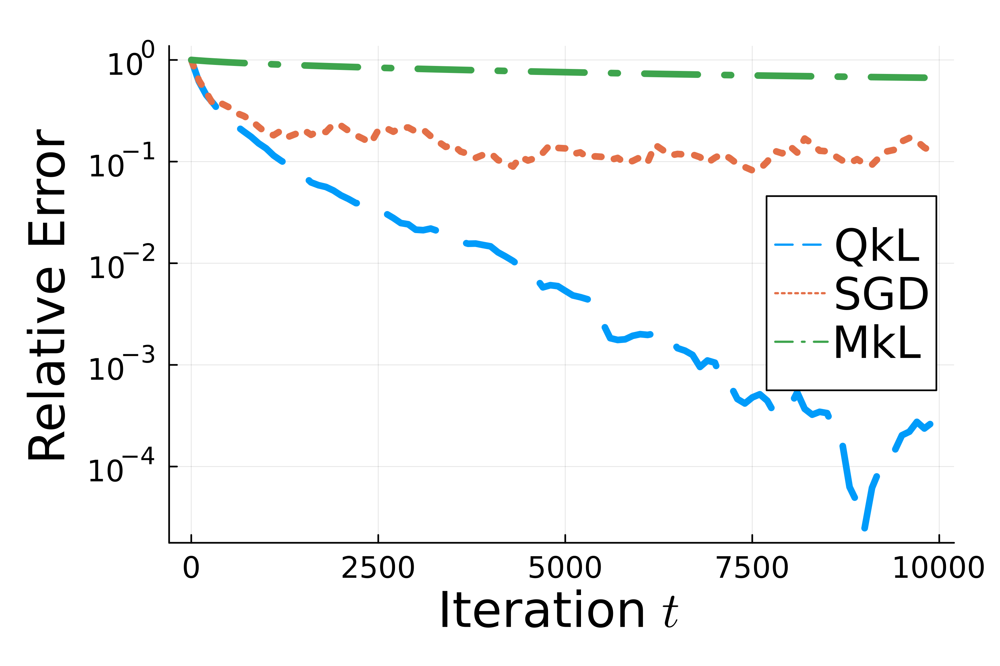

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_error_1percoutlier.png"

In [12]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.6))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/logisticregression_error_1percoutlier.png")

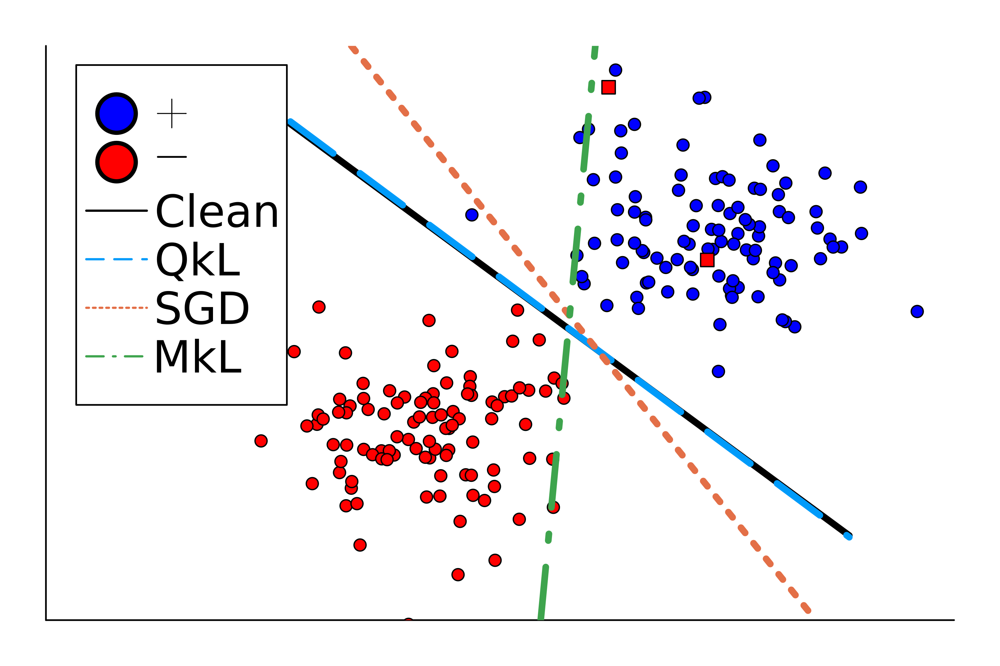

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_viz_1percoutlier.png"

In [13]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==0], dcomp2[t_plot.==0], marker=:circle, label=L"-", color=:red)
	scatter!(dcomp1[Oset], dcomp2[Oset], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, color=:black, lw=4,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, linestyle=:dash, lw=4, color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, linestyle=:dot, lw=4, color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)
	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("1% Outliers")
	display(p)
	savefig("figs/logisticregression_viz_1percoutlier.png")
end

# Outlier example -- $\beta = 0.1$, $q = 0.9$, $\alpha = 1$, outliers randomly selected from both classes

In [14]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), zeros(class_size))  # Labels: 1 for positive, 0 for negative

	β = 0.1
	Oset = rand(1:n_samples, Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= 1 .- t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end


181-element Vector{Int64}:
   1
   3
   5
   6
   7
   8
   9
  10
  11
  12
  15
  16
  17
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

(181,)(200,)(180,)(1,)

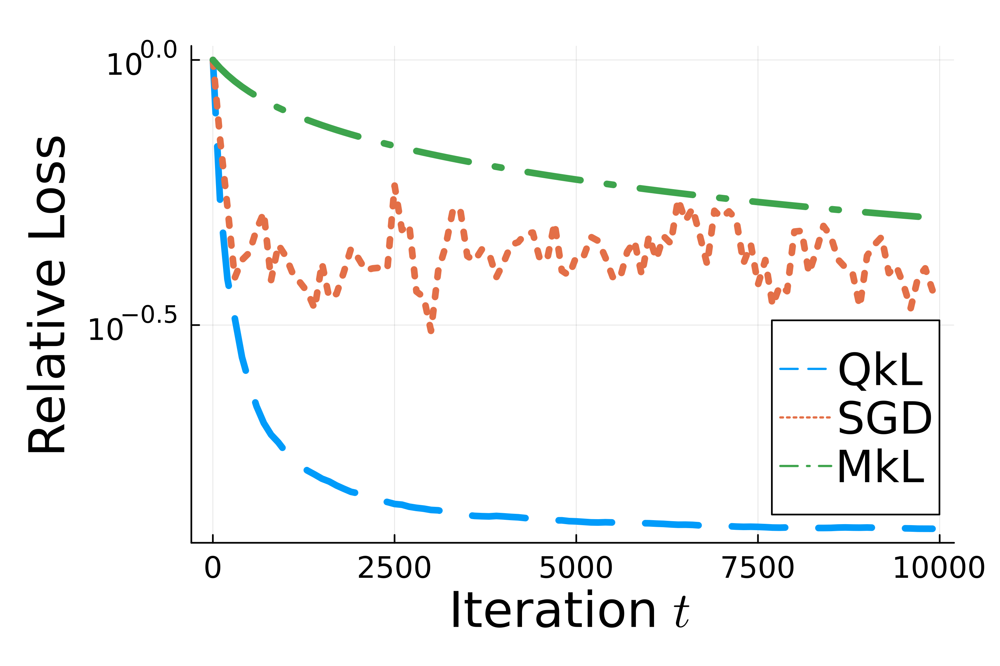

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_10percoutlier2class.png"

In [15]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_logistic(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_logistic(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_logistic(x0, D_aug, t, 200, 0.9, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_logistic(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10,legend=(0.85,0.35))

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/logisticregression_loss_10percoutlier2class.png")

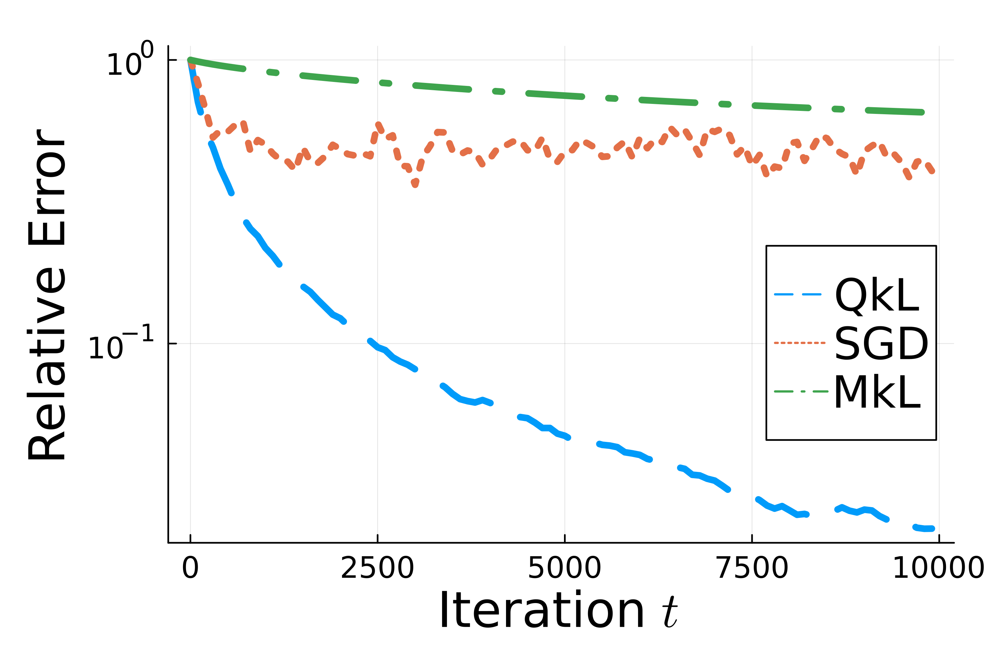

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_error_10percoutlier2class.png"

In [16]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.5))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/logisticregression_error_10percoutlier2class.png")

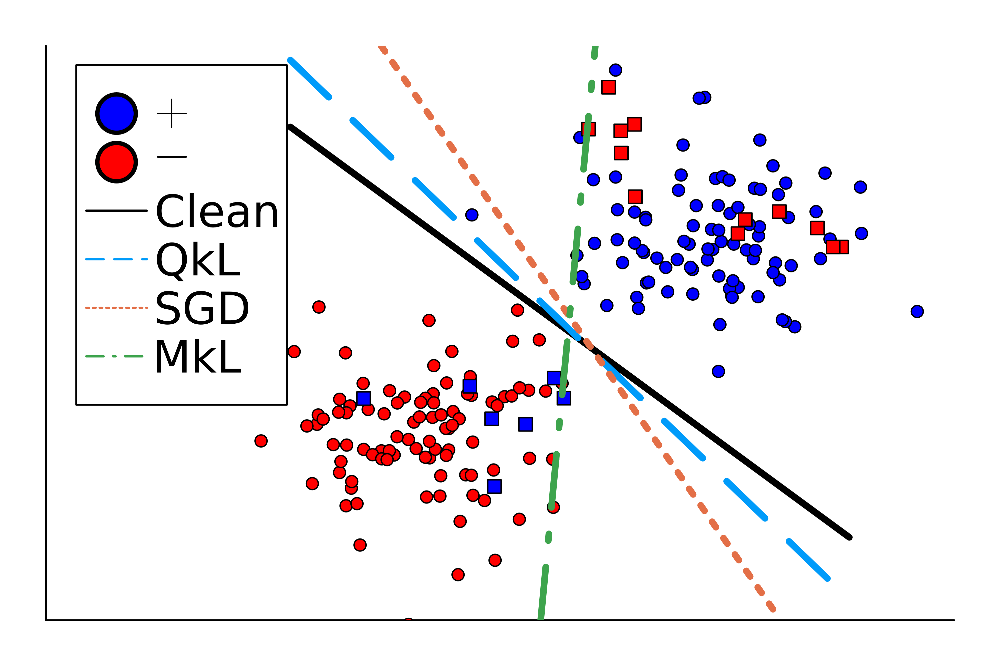

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_viz_10percoutlier2class.png"

In [17]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==0], dcomp2[t_plot.==0], marker=:circle, label=L"-", color=:red)

	O_pos = intersect(Oset, findall(t_plot .== 1))
	O_neg = intersect(Oset, findall(t_plot .== 0))
	scatter!(dcomp1[O_pos], dcomp2[O_pos], marker=:square, label=nothing, color=:blue)
	scatter!(dcomp1[O_neg], dcomp2[O_neg], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, lw=4, color=:black,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, lw=4, linestyle=:dash,color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, lw=4, linestyle=:dot,color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)

	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("10% Outliers")
	display(p)
	savefig("figs/logisticregression_viz_10percoutlier2class.png")
end

# Outlier example -- $\beta = 0.1$, $q = 0.9$, $\alpha = 1$, outliers randomly selected from one class

In [18]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), zeros(class_size))  # Labels: 1 for positive, 0 for negative

	β = 0.1
	Oset = rand(1:Int(n_samples/2), Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= 1 .- t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end

182-element Vector{Int64}:
   1
   2
   3
   4
   5
   6
   7
   8
   9
  10
  11
  12
  13
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

(182,)(200,)(180,)(1,)

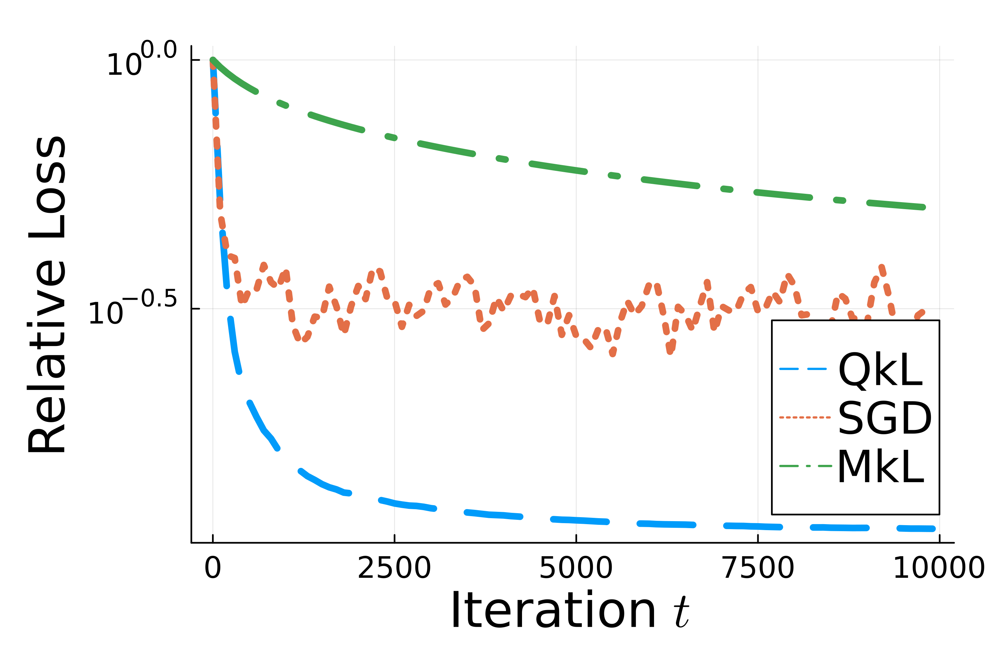

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_10percoutlier1class.png"

In [19]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_logistic(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_logistic(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_logistic(x0, D_aug, t, 200, 0.9, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_logistic(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10,legend=(0.85,0.35))

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/logisticregression_loss_10percoutlier1class.png")

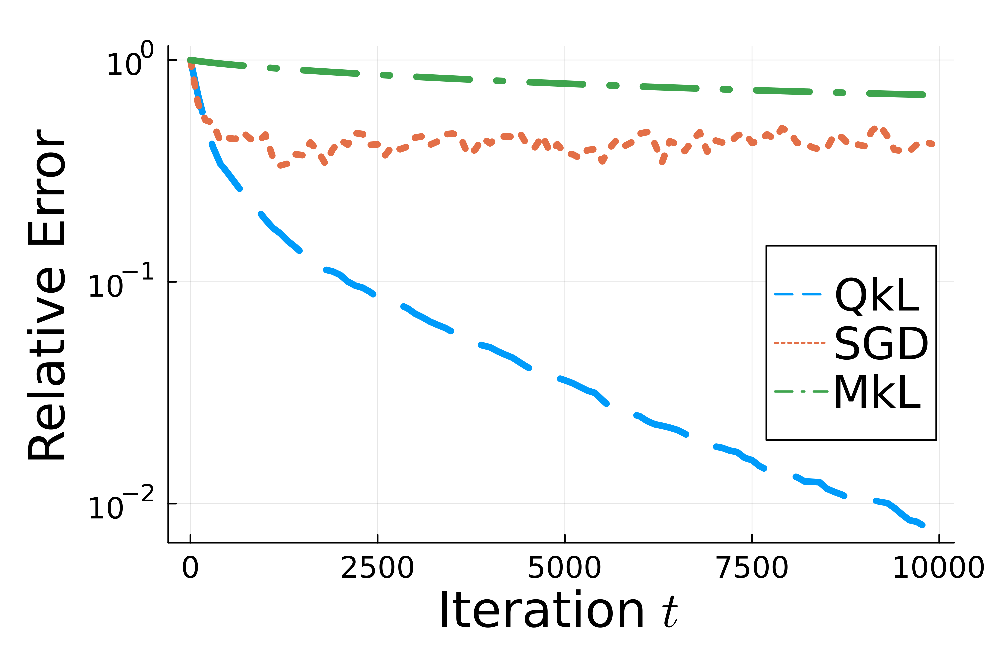

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_error_10percoutlier1class.png"

In [20]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.5))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/logisticregression_error_10percoutlier1class.png")

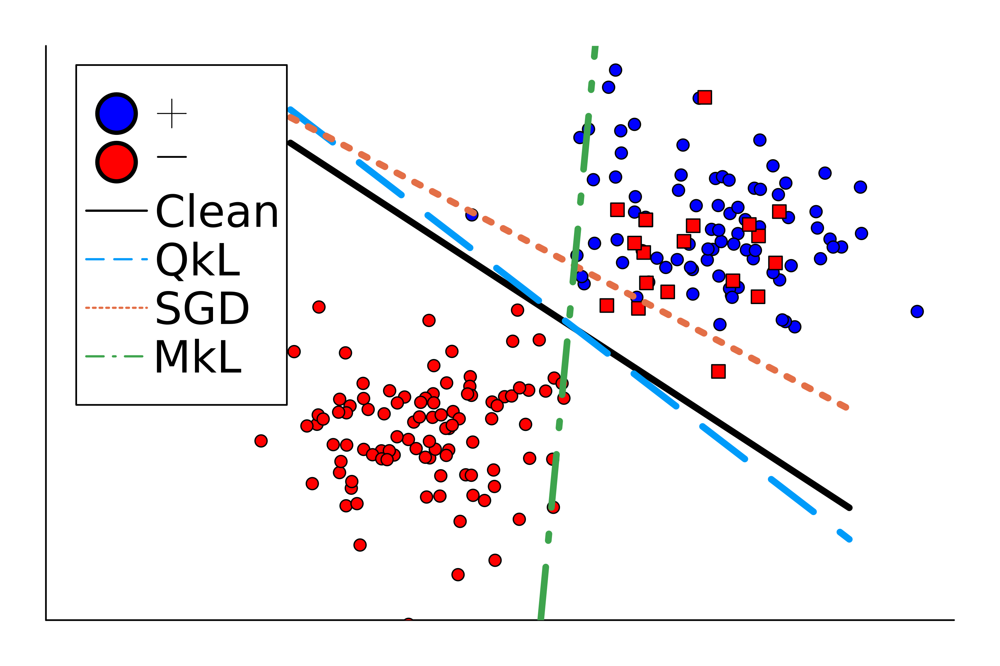

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_viz_10percoutlier1class.png"

In [21]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==0], dcomp2[t_plot.==0], marker=:circle, label=L"-", color=:red)
	scatter!(dcomp1[Oset], dcomp2[Oset], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, lw=4, color=:black,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, lw=4, linestyle=:dash,color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, lw=4, linestyle=:dot,color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)

	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("10% Outliers")
	display(p)
	savefig("figs/logisticregression_viz_10percoutlier1class.png")
end

# Outlier example -- $\beta = 0.05$, $q = 0.95$, $\alpha = 1$, outliers randomly selected from both classes

In [22]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), zeros(class_size))  # Labels: 1 for positive, 0 for negative

	β = 0.05
	Oset = rand(1:n_samples, Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= 1 .- t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end


190-element Vector{Int64}:
   1
   2
   3
   4
   5
   6
   7
   8
   9
  10
  11
  12
  13
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

(190,)(200,)(190,)(1,)

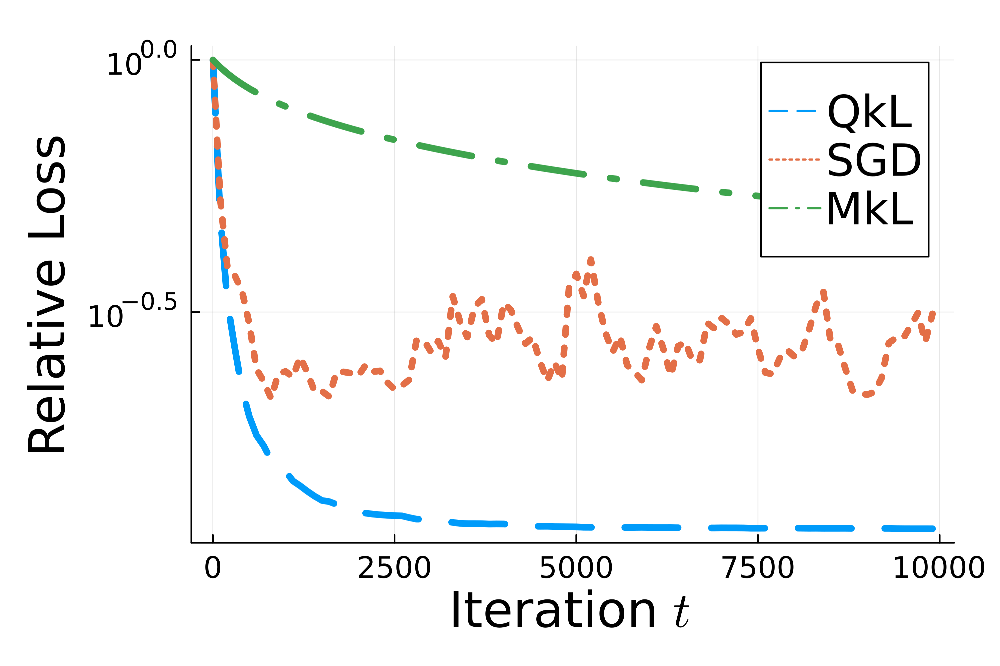

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_5percoutlier2class.png"

In [23]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_logistic(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_logistic(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_logistic(x0, D_aug, t, 200, 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_logistic(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10)

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/logisticregression_loss_5percoutlier2class.png")

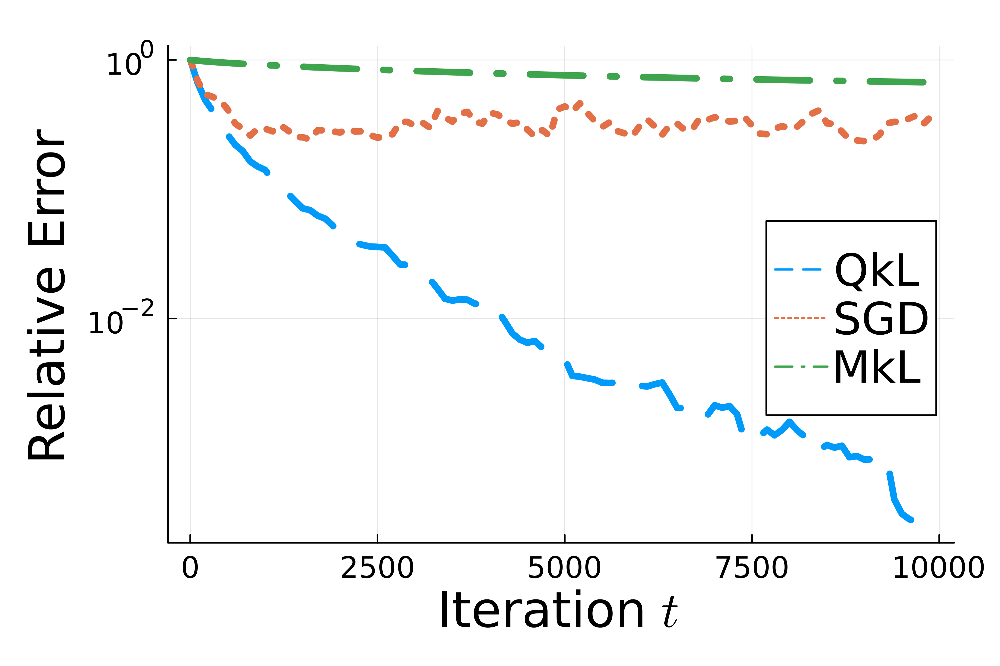

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_error_5percoutlier2class.png"

In [24]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.55))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/logisticregression_error_5percoutlier2class.png")

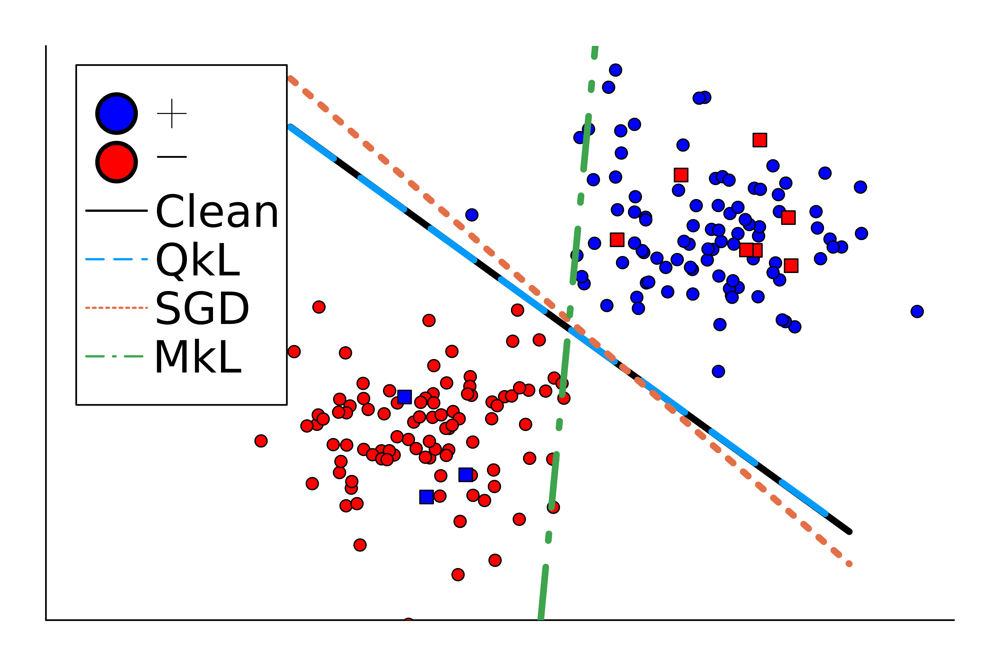

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_viz_5percoutlier2class.png"

In [25]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==0], dcomp2[t_plot.==0], marker=:circle, label=L"-", color=:red)

	O_pos = intersect(Oset, findall(t_plot .== 1))
	O_neg = intersect(Oset, findall(t_plot .== 0))
	scatter!(dcomp1[O_pos], dcomp2[O_pos], marker=:square, label=nothing, color=:blue)
	scatter!(dcomp1[O_neg], dcomp2[O_neg], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, lw=4, color=:black,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, lw=4, linestyle=:dash,color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, lw=4, linestyle=:dot,color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)

	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)

	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("10% Outliers")
	display(p)
	savefig("figs/logisticregression_viz_5percoutlier2class.png")
end

# Outlier example -- $\beta = 0.05$, $q = 0.95$, $\alpha = 1$, outliers randomly selected from one class

In [26]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), zeros(class_size))  # Labels: 1 for positive, 0 for negative

	β = 0.05
	Oset = rand(1:Int(n_samples/2), Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= 1 .- t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end

191-element Vector{Int64}:
   1
   2
   3
   4
   5
   6
   7
   8
   9
  10
  11
  12
  13
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

(191,)(200,)(190,)(1,)

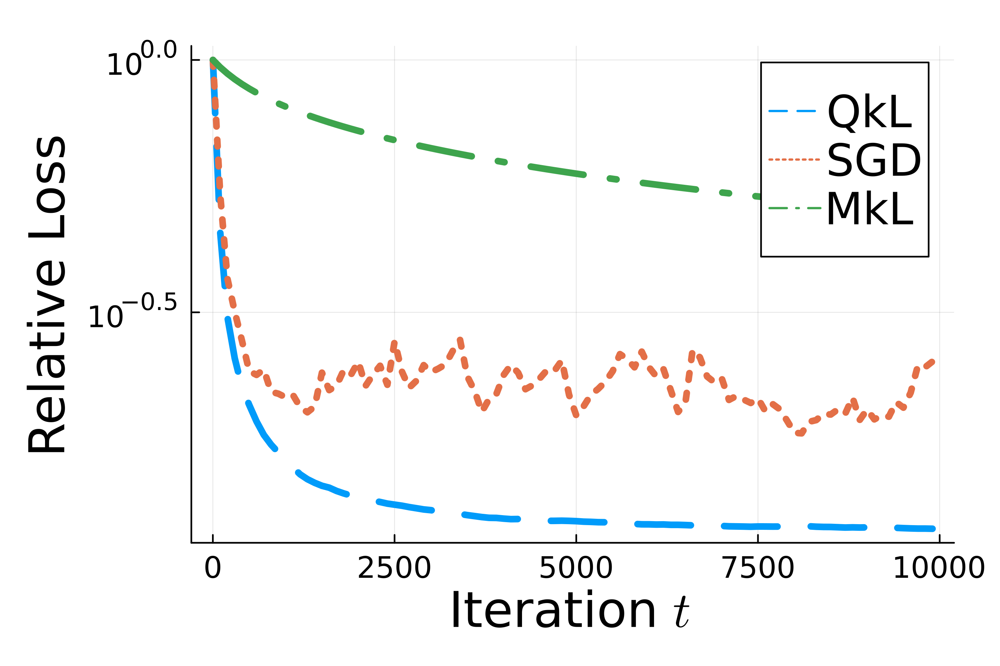

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_5percoutlier1class.png"

In [27]:
# what happens if we use SGD instead of QkL-SGD?

# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_logistic(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

# Train model with SGD
sgd_x, G_loss_hist, O_loss_hist, indices, O_allowed, sgd_error = qklsgd_logistic(x0, D_aug, t, 200, 1.0, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_logistic(x0, D_aug, t, 200, 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist, O_loss_hist, indices, O_allowed, mklsgd_error = mklsgd_logistic(x0, D_aug, t, 200, Gset, Oset, iters=10000, xstar = Gsgd_x)

iters = 1:10000

# Plot loss curve
# Main plots (hidden from legend)
p = plot(iters[1:100:end], qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1],
     label=nothing, linestyle=:dash, xlabel=L"Iteration $t$",
     ylabel="Relative Loss", lw=4, dpi=500,
     margin=5mm, yscale=:log10)

plot!(iters[1:100:end], G_loss_hist[1:100:end]/G_loss_hist[1],
      label=nothing, linestyle=:dot, lw=4, yscale=:log10)

plot!(iters[1:100:end], mkl_G_loss_hist[1:100:end]/mkl_G_loss_hist[1],
      label=nothing, linestyle=:dashdot, lw=4, yscale=:log10)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/logisticregression_loss_5percoutlier1class.png")

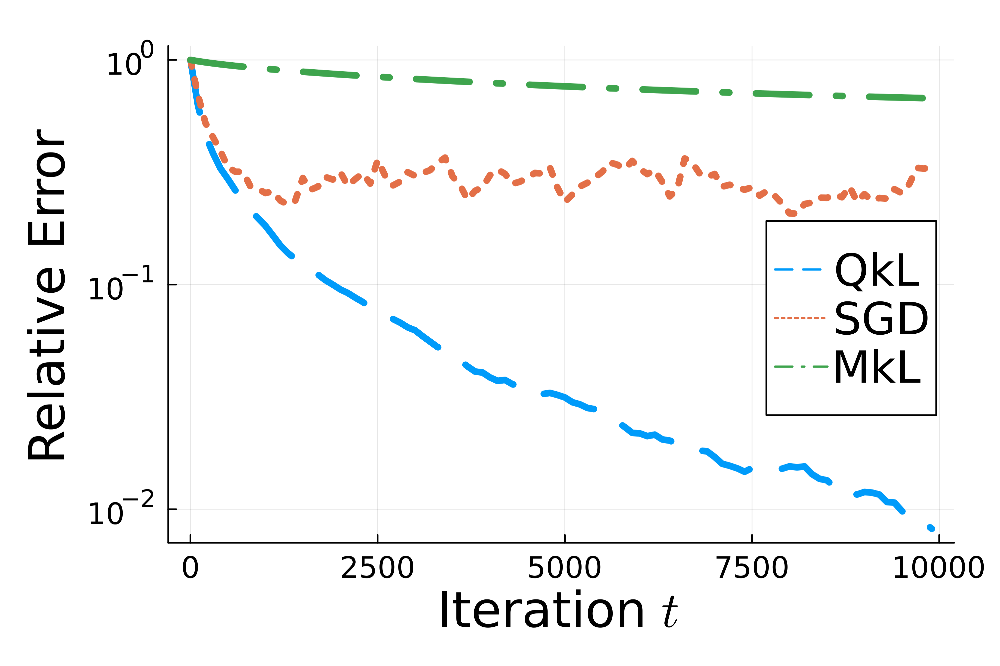

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_error_5percoutlier1class.png"

In [28]:
iters = 1:10000

# Plot error curve
p = plot(iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], xlabel=L"Iteration $t$", ylabel="Relative Error", lw=4,yscale=:log10, dpi=500,margin=5mm, linestyle=:dash, label=nothing,legend=(0.85,0.55))
plot!(iters[1:100:end],sgd_error[1:100:end]/sgd_error[1], linestyle=:dot, lw=4,yscale=:log10, label=nothing)
plot!(iters[1:100:end],mklsgd_error[1:100:end]/mklsgd_error[1], linestyle=:dashdot, lw=4,yscale=:log10, label=nothing)

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
display(p)
savefig("figs/logisticregression_error_5percoutlier1class.png")

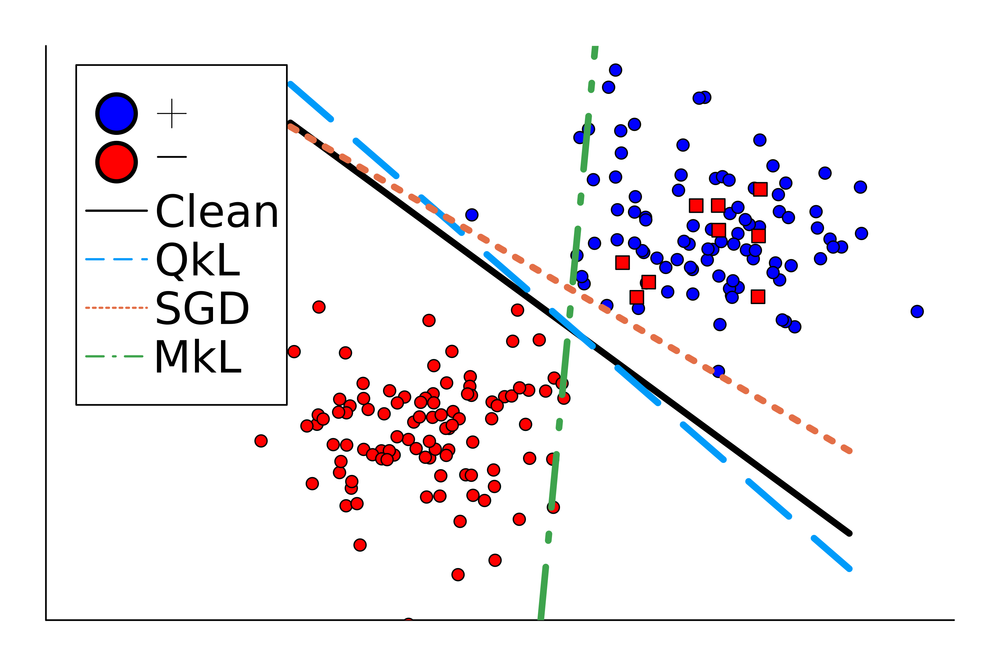

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_viz_5percoutlier1class.png"

In [29]:
# Visualize data and decision boundary
begin
	dcomp1 = D_aug[2, :]
	dcomp2 = D_aug[3, :]
	t_plot = t

	p = scatter(dcomp1[t_plot.==1], dcomp2[t_plot.==1], marker=:circle, label=L"+", color=:blue, legend=:topleft,ticks=false, dpi=500,margin=5mm)
	scatter!(dcomp1[t_plot.==0], dcomp2[t_plot.==0], marker=:circle, label=L"-", color=:red)
	scatter!(dcomp1[Oset], dcomp2[Oset], marker=:square, label=nothing, color=:red)

	# Plot decision boundary: w0 + w1*x1 + w2*x2 = 0 --> x2 = -(w0 + w1*x1)/w2
	range = -4:0.1:4
	true_boundary = -(Gsgd_x[1] .+ Gsgd_x[2]*dcomp1_range) ./ Gsgd_x[3]
	plot!(range,true_boundary, lw=4, color=:black,label=nothing)
	qklsgd_boundary = -(qklsgd_x[1] .+ qklsgd_x[2]*dcomp1_range) ./ qklsgd_x[3]
	plot!(range, qklsgd_boundary, lw=4, linestyle=:dash,color=1,label=nothing)
	sgd_boundary = -(sgd_x[1] .+ sgd_x[2]*dcomp1_range) ./ sgd_x[3]
	plot!(range, sgd_boundary, lw=4, linestyle=:dot,color=2,label=nothing)
	mklsgd_boundary = -(mklsgd_x[1] .+ mklsgd_x[2]*dcomp1_range) ./ mklsgd_x[3]
	plot!(range, mklsgd_boundary, linestyle=:dashdot, lw=4, color=3,label=nothing)

	# Burner plots (only for legend, thin lines)
	plot!([NaN], [NaN], label="Clean", linestyle=:solid, lw=0.6, color=:black)
	plot!([NaN], [NaN], label="QkL", linestyle=:dash, lw=0.6, color=1)
	plot!([NaN], [NaN], label="SGD", linestyle=:dot, lw=0.6, color=2)
	plot!([NaN], [NaN], label="MkL", linestyle=:dashdot, lw=0.6, color=3)
	
	xlims!(-7.5,5.5)
	ylims!(-5.5,5.5)

	#title!("10% Outliers")
	display(p)
	savefig("figs/logisticregression_viz_5percoutlier1class.png")
end

# Small sample size

In [30]:
# Generate linearly separable 2D data with $\beta = 0.1$ fraction mislabelled
begin
    # reset labels
	t = vcat(ones(class_size), zeros(class_size))  # Labels: 1 for positive, 0 for negative

	β = 0.05
	Oset = rand(1:Int(n_samples/2), Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= 1 .- t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset
end

191-element Vector{Int64}:
   1
   2
   3
   4
   6
   7
   8
   9
  10
  12
  13
  15
  16
   ⋮
 189
 190
 191
 192
 193
 194
 195
 196
 197
 198
 199
 200

In [31]:
# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_logistic(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)


alpha = 0.9
# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist9, O_loss_hist, indices, O_allowed, qklsgd_error9 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist9, O_loss_hist, indices, O_allowed, mklsgd_error9 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

alpha = 0.5
# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist5, O_loss_hist, indices, O_allowed, qklsgd_error5 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist5, O_loss_hist, indices, O_allowed, mklsgd_error5 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

alpha = 0.1
# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist1, O_loss_hist, indices, O_allowed, qklsgd_error1 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist1, O_loss_hist, indices, O_allowed, mklsgd_error1 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)


(191,)(171,)(1,)(95,)(1,)(19,)(1,)

([-0.2468738930686711, 1.3355393196721783, 0.31860807222621357], [70.04892021595688, 69.95018287902876, 69.82698742386195, 69.72953860903702, 69.62005264272983, 69.45270668293476, 69.26594941057466, 69.10205385882014, 69.00844916320091, 68.98446846455083  …  18.238665445518812, 18.239651616096484, 18.240637485429854, 18.238579309993934, 18.23898252593506, 18.236481376556764, 18.234727809113288, 18.23451619860992, 18.23147463445407, 18.228981136932607], [13.513999086400332, 13.529118623708651, 13.548090462440424, 13.563077800117675, 13.579986698173958, 13.610760886301197, 13.645950394585835, 13.676315832976762, 13.690920781065506, 13.696015264298355  …  28.400339273647695, 28.39887394082315, 28.397409208679594, 28.399221649695807, 28.398952974922246, 28.40060740266106, 28.402324028727172, 28.40217923072484, 28.40540918147081, 28.407058147383854], [180, 158, 180, 169, 69, 30, 69, 180, 38, 200  …  182, 182, 22, 187, 108, 154, 180, 3, 108, 131], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0

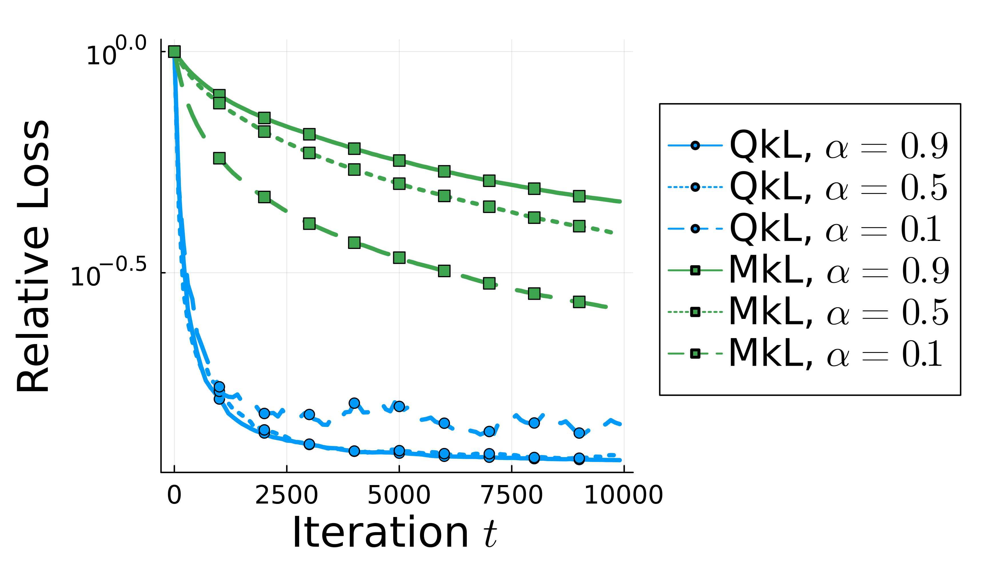

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_varyalpha_5percoutlier1class.png"

In [32]:
iters = 1:10000

# Plot loss curve
p = plot(iters[1:100:end],qkl_G_loss_hist9[1:100:end]/qkl_G_loss_hist9[1], label=nothing, xlabel=L"Iteration $t$", ylabel="Relative Loss", lw=3, dpi=500,margin=5mm,yscale=:log10,color=1,legend=:outerright,size = (700, 400))
scatter!(iters[1:1000:end],qkl_G_loss_hist9[1:1000:end]/qkl_G_loss_hist9[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],qkl_G_loss_hist5[1:100:end]/qkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=1,linestyle=:dot)
scatter!(iters[1:1000:end],qkl_G_loss_hist5[1:1000:end]/qkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],qkl_G_loss_hist1[1:100:end]/qkl_G_loss_hist1[1], label=nothing, lw=3,yscale=:log10,color=1,linestyle=:dash)
scatter!(iters[1:1000:end],qkl_G_loss_hist1[1:1000:end]/qkl_G_loss_hist1[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],mkl_G_loss_hist9[1:100:end]/mkl_G_loss_hist9[1], label=nothing, lw=3,yscale=:log10,color=3)
scatter!(iters[1:1000:end],mkl_G_loss_hist9[1:1000:end]/mkl_G_loss_hist9[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
plot!(iters[1:100:end],mkl_G_loss_hist5[1:100:end]/mkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dot)
scatter!(iters[1:1000:end],mkl_G_loss_hist5[1:1000:end]/mkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
plot!(iters[1:100:end],mkl_G_loss_hist1[1:100:end]/mkl_G_loss_hist1[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dash)
scatter!(iters[1:1000:end],mkl_G_loss_hist1[1:1000:end]/mkl_G_loss_hist1[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.9$", linestyle=:solid, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.5$", linestyle=:dot, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.1$", linestyle=:dash, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.9$", linestyle=:solid, lw=0.6, color=3,marker=:square)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.5$", linestyle=:dot, lw=0.6, color=3,marker=:square)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.1$", linestyle=:dash, lw=0.6, color=3,marker=:square)

display(p)
savefig("figs/logisticregression_loss_varyalpha_5percoutlier1class.png")

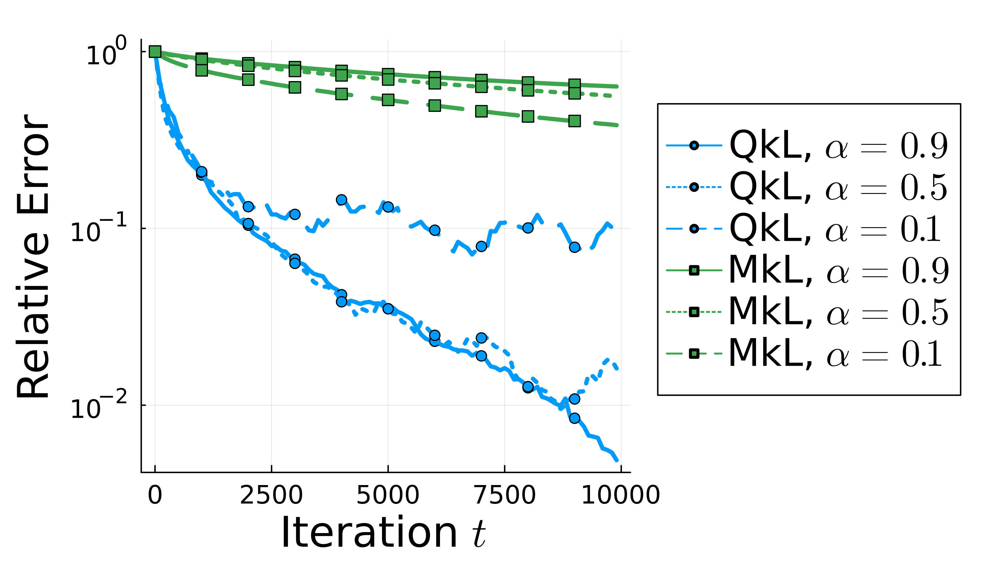

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_error_varyalpha_5percoutlier1class.png"

In [33]:
iters = 1:10000

# Plot errors
p = plot(iters[1:100:end],qklsgd_error9[1:100:end]/qklsgd_error9[1], label=nothing, xlabel=L"Iteration $t$", ylabel="Relative Error", lw=3, dpi=500,margin=5mm,yscale=:log10,color=1,legend=:outerright,size = (700, 400))
scatter!(iters[1:1000:end],qklsgd_error9[1:1000:end]/qklsgd_error9[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],qklsgd_error5[1:100:end]/qklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=1,linestyle=:dot)
scatter!(iters[1:1000:end],qklsgd_error5[1:1000:end]/qklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],qklsgd_error1[1:100:end]/qklsgd_error1[1], label=nothing, lw=3,yscale=:log10,color=1,linestyle=:dash)
scatter!(iters[1:1000:end],qklsgd_error1[1:1000:end]/qklsgd_error1[1], label=nothing, lw=3,yscale=:log10,color=1)
plot!(iters[1:100:end],mklsgd_error9[1:100:end]/mklsgd_error9[1], label=nothing, lw=3,yscale=:log10,color=3)
scatter!(iters[1:1000:end],mklsgd_error9[1:1000:end]/mklsgd_error9[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
plot!(iters[1:100:end],mklsgd_error5[1:100:end]/mklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dot)
scatter!(iters[1:1000:end],mklsgd_error5[1:1000:end]/mklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
plot!(iters[1:100:end],mklsgd_error1[1:100:end]/mklsgd_error1[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dash)
scatter!(iters[1:1000:end],mklsgd_error1[1:1000:end]/mklsgd_error1[1], label=nothing, lw=3,yscale=:log10,color=3,marker=:square)
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.9$", linestyle=:solid, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.5$", linestyle=:dot, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"QkL, $\alpha = 0.1$", linestyle=:dash, lw=0.6, color=1,marker=:circle)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.9$", linestyle=:solid, lw=0.6, color=3,marker=:square)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.5$", linestyle=:dot, lw=0.6, color=3,marker=:square)
plot!([NaN], [NaN], label=L"MkL, $\alpha = 0.1$", linestyle=:dash, lw=0.6, color=3,marker=:square)

display(p)
savefig("figs/logisticregression_error_varyalpha_5percoutlier1class.png")

## Very small sample size

In [34]:
# Train model with QkL-SGD
qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_logistic(x0, D_aug, t, 200, 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

# Train model with MkL-SGD
mklsgd_x, mkl_G_loss_hist2, O_loss_hist, indices, O_allowed, mklsgd_error2 = mklsgd_logistic(x0, D_aug, t, 2, Gset, Oset, iters=1000000, xstar = Gsgd_x)
mklsgd_x, mkl_G_loss_hist5, O_loss_hist, indices, O_allowed, mklsgd_error5 = mklsgd_logistic(x0, D_aug, t, 5, Gset, Oset, iters=400000, xstar = Gsgd_x)
mklsgd_x, mkl_G_loss_hist10, O_loss_hist, indices, O_allowed, mklsgd_error10 = mklsgd_logistic(x0, D_aug, t, 10, Gset, Oset, iters=200000, xstar = Gsgd_x)

(190,)(1,)(1,)(1,)

([-0.015459927659971028, 1.0126021735787625, 0.9293845329737348], [70.04892021595688, 69.93914488483831, 69.7690211319992, 69.6718793084343, 69.5752870896757, 69.37499601042846, 69.26771669279252, 68.93043315851965, 68.90433760221514, 68.88994017847357  …  11.732064920422792, 11.73302483889647, 11.733295153518725, 11.733537417258862, 11.734497114662911, 11.735724965622607, 11.73363478507098, 11.73435605824964, 11.735303963387947, 11.735545335628313], [13.513999086400332, 13.531649001978263, 13.562736138719089, 13.577694867193086, 13.592597263615335, 13.641723002180136, 13.658418862811892, 13.705524813637282, 13.710295911904288, 13.713666948126571  …  34.90857668042884, 34.90670465145108, 34.90586670164299, 34.9056466163963, 34.90377578930428, 34.90112297384678, 34.90665405041743, 34.90501638113602, 34.902900006924426, 34.902682115539406], [141, 69, 180, 180, 10, 169, 192, 187, 116, 180  …  26, 108, 7, 26, 131, 54, 182, 122, 7, 131], [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0

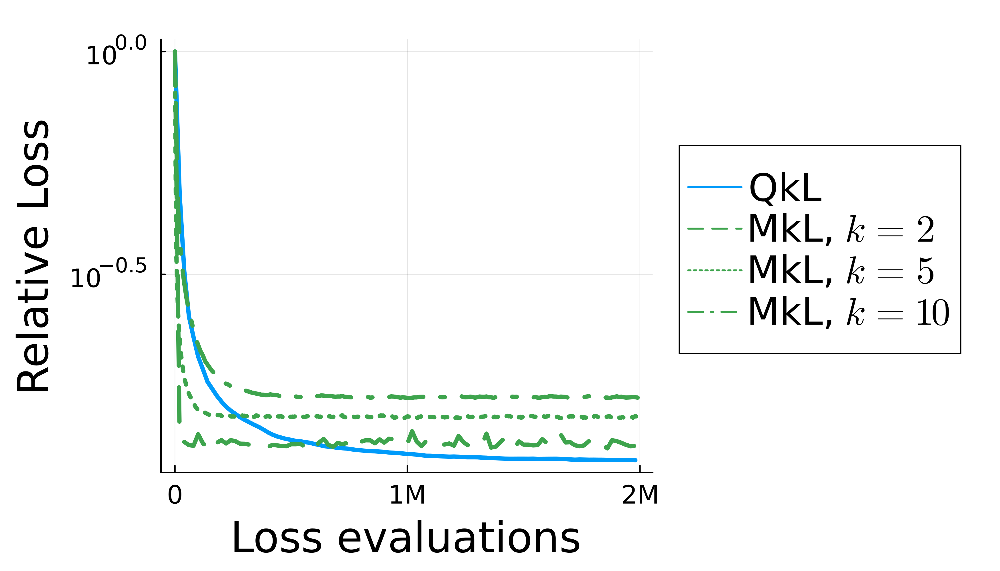

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_smallk_5percoutlier1class.png"

In [35]:
iters = 1:10000

# Plot loss curve
p = plot(200*iters[1:100:end],qkl_G_loss_hist[1:100:end]/qkl_G_loss_hist[1], label=nothing, xlabel="Loss evaluations", ylabel="Relative Loss", lw=3, dpi=500,margin=5mm,yscale=:log10,color=1,legend=:outerright,size = (700, 400))
iters = 1:1000000
plot!(2*iters[1:10000:end],mkl_G_loss_hist2[1:10000:end]/mkl_G_loss_hist2[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dash)
iters = 1:400000
plot!(5*iters[1:1000:end],mkl_G_loss_hist5[1:1000:end]/mkl_G_loss_hist5[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dot)
iters = 1:200000
plot!(10*iters[1:1000:end],mkl_G_loss_hist10[1:1000:end]/mkl_G_loss_hist10[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dashdot)
xticks!([0,1000000,2000000],["0","1M","2M"])
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:solid, lw=0.6, color=1)
plot!([NaN], [NaN], label=L"MkL, $k = 2$", linestyle=:dash, lw=0.6, color=3)
plot!([NaN], [NaN], label=L"MkL, $k = 5$", linestyle=:dot, lw=0.6, color=3)
plot!([NaN], [NaN], label=L"MkL, $k = 10$", linestyle=:dashdot, lw=0.6, color=3)

display(p)
savefig("figs/logisticregression_loss_smallk_5percoutlier1class.png")

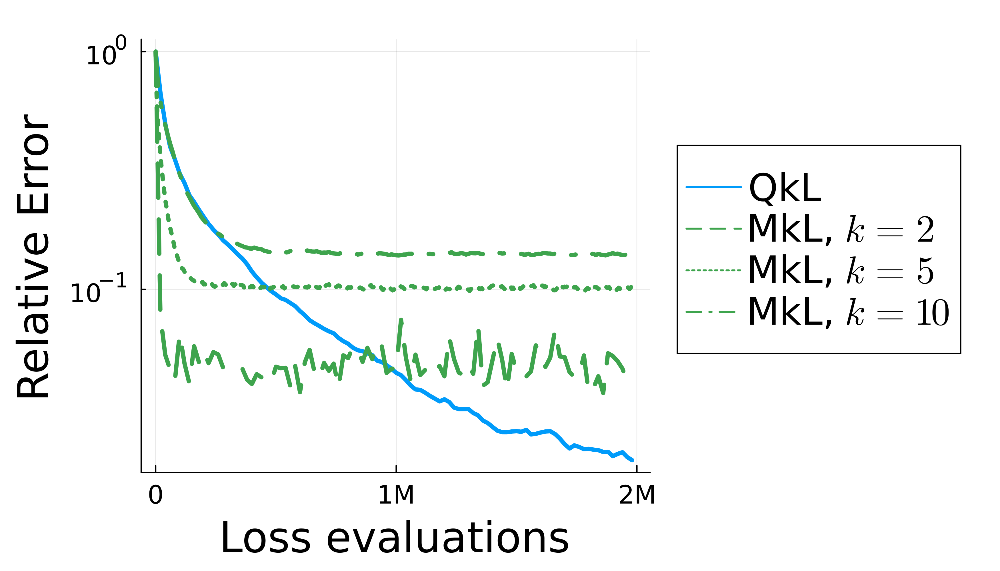

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_error_smallk_5percoutlier1class.png"

In [36]:
iters = 1:10000

# Plot errors
p = plot(200*iters[1:100:end],qklsgd_error[1:100:end]/qklsgd_error[1], label=nothing, xlabel="Loss evaluations", ylabel="Relative Error", lw=3, dpi=500,margin=5mm,yscale=:log10,color=1,legend=:outerright,size = (700, 400))
iters = 1:1000000
plot!(2*iters[1:10000:end],mklsgd_error2[1:10000:end]/mklsgd_error2[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dash)
iters = 1:400000
plot!(5*iters[1:1000:end],mklsgd_error5[1:1000:end]/mklsgd_error5[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dot)
iters = 1:200000
plot!(10*iters[1:1000:end],mklsgd_error10[1:1000:end]/mklsgd_error10[1], label=nothing, lw=3,yscale=:log10,color=3,linestyle=:dashdot)
xticks!([0,1000000,2000000],["0","1M","2M"])

# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:solid, lw=0.6, color=1)
plot!([NaN], [NaN], label=L"MkL, $k = 2$", linestyle=:dash, lw=0.6, color=3)
plot!([NaN], [NaN], label=L"MkL, $k = 5$", linestyle=:dot, lw=0.6, color=3)
plot!([NaN], [NaN], label=L"MkL, $k = 10$", linestyle=:dashdot, lw=0.6, color=3)

display(p)
savefig("figs/logisticregression_error_smallk_5percoutlier1class.png")

# Sample size vs Final Relative Error

In [37]:
# run SGD on problem defined only by good set
Gsgd_x, loss_hist, loss_hist, indices, O_allowed = qklsgd_logistic(x0, D_aug[:,Gset], t[Gset], length(Gset), 1.0, 1:length(Gset), [], iters=100000)

num_trials = 100
alphas = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 0.95, 1.0]
num_alphas = length(alphas)

qkl_relative_errors = zeros(num_trials, num_alphas)
mkl_relative_errors = zeros(num_trials, num_alphas)
qkl_relative_losses = zeros(num_trials, num_alphas)
mkl_relative_losses = zeros(num_trials, num_alphas)

iters = 10000
for trial = 1:num_trials

    alpha = 1.0
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist10, O_loss_hist, indices, O_allowed, qklsgd_error10 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist10, O_loss_hist, indices, O_allowed, mklsgd_error10 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.95
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist95, O_loss_hist, indices, O_allowed, qklsgd_error95 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist95, O_loss_hist, indices, O_allowed, mklsgd_error95 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.9
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist9, O_loss_hist, indices, O_allowed, qklsgd_error9 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist9, O_loss_hist, indices, O_allowed, mklsgd_error9 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.8
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist8, O_loss_hist, indices, O_allowed, qklsgd_error8 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist8, O_loss_hist, indices, O_allowed, mklsgd_error8 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.7
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist7, O_loss_hist, indices, O_allowed, qklsgd_error7 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist7, O_loss_hist, indices, O_allowed, mklsgd_error7 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.6
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist6, O_loss_hist, indices, O_allowed, qklsgd_error6 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist6, O_loss_hist, indices, O_allowed, mklsgd_error6 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.5
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist5, O_loss_hist, indices, O_allowed, qklsgd_error5 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist5, O_loss_hist, indices, O_allowed, mklsgd_error5 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.4
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist4, O_loss_hist, indices, O_allowed, qklsgd_error4 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist4, O_loss_hist, indices, O_allowed, mklsgd_error4 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.3
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist3, O_loss_hist, indices, O_allowed, qklsgd_error3 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist3, O_loss_hist, indices, O_allowed, mklsgd_error3 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.2
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist2, O_loss_hist, indices, O_allowed, qklsgd_error2 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist2, O_loss_hist, indices, O_allowed, mklsgd_error2 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.1
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist1, O_loss_hist, indices, O_allowed, qklsgd_error1 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist1, O_loss_hist, indices, O_allowed, mklsgd_error1 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    alpha = 0.05
    # Train model with QkL-SGD
    qklsgd_x, qkl_G_loss_hist05, O_loss_hist, indices, O_allowed, qklsgd_error05 = qklsgd_logistic(x0, D_aug, t, Int(alpha*200), 0.95, Gset, Oset, iters=10000, xstar = Gsgd_x)

    # Train model with MkL-SGD
    mklsgd_x, mkl_G_loss_hist05, O_loss_hist, indices, O_allowed, mklsgd_error05 = mklsgd_logistic(x0, D_aug, t, Int(alpha*200), Gset, Oset, iters=10000, xstar = Gsgd_x)

    qkl_relative_losses[trial,:] = [qkl_G_loss_hist05[iters]/qkl_G_loss_hist05[1], qkl_G_loss_hist1[iters]/qkl_G_loss_hist1[1], qkl_G_loss_hist2[iters]/qkl_G_loss_hist2[1], qkl_G_loss_hist3[iters]/qkl_G_loss_hist3[1], qkl_G_loss_hist4[iters]/qkl_G_loss_hist4[1], qkl_G_loss_hist5[iters]/qkl_G_loss_hist5[1], qkl_G_loss_hist6[iters]/qkl_G_loss_hist6[1], qkl_G_loss_hist7[iters]/qkl_G_loss_hist7[1], qkl_G_loss_hist8[iters]/qkl_G_loss_hist8[1], qkl_G_loss_hist9[iters]/qkl_G_loss_hist9[1], qkl_G_loss_hist95[iters]/qkl_G_loss_hist95[1], qkl_G_loss_hist10[iters]/qkl_G_loss_hist10[1]]
    mkl_relative_losses[trial,:] = [mkl_G_loss_hist05[iters]/mkl_G_loss_hist05[1], mkl_G_loss_hist1[iters]/mkl_G_loss_hist1[1], mkl_G_loss_hist2[iters]/mkl_G_loss_hist2[1], mkl_G_loss_hist3[iters]/mkl_G_loss_hist3[1], mkl_G_loss_hist4[iters]/mkl_G_loss_hist4[1], mkl_G_loss_hist5[iters]/mkl_G_loss_hist5[1], mkl_G_loss_hist6[iters]/mkl_G_loss_hist6[1], mkl_G_loss_hist7[iters]/mkl_G_loss_hist7[1], mkl_G_loss_hist8[iters]/mkl_G_loss_hist8[1], mkl_G_loss_hist9[iters]/mkl_G_loss_hist9[1], mkl_G_loss_hist95[iters]/mkl_G_loss_hist95[1], mkl_G_loss_hist10[iters]/mkl_G_loss_hist10[1]]

    qkl_relative_errors[trial,:] = [qklsgd_error05[iters]/qklsgd_error05[1], qklsgd_error1[iters]/qklsgd_error1[1], qklsgd_error2[iters]/qklsgd_error2[1], qklsgd_error3[iters]/qklsgd_error3[1], qklsgd_error4[iters]/qklsgd_error4[1], qklsgd_error5[iters]/qklsgd_error5[1], qklsgd_error6[iters]/qklsgd_error6[1], qklsgd_error7[iters]/qklsgd_error7[1], qklsgd_error8[iters]/qklsgd_error8[1], qklsgd_error9[iters]/qklsgd_error9[1], qklsgd_error95[iters]/qklsgd_error95[1], qklsgd_error10[iters]/qklsgd_error10[1]]
    mkl_relative_errors[trial,:] = [mklsgd_error05[iters]/mklsgd_error05[1], mklsgd_error1[iters]/mklsgd_error1[1], mklsgd_error2[iters]/mklsgd_error2[1], mklsgd_error3[iters]/mklsgd_error3[1], mklsgd_error4[iters]/mklsgd_error4[1], mklsgd_error5[iters]/mklsgd_error5[1], mklsgd_error6[iters]/mklsgd_error6[1], mklsgd_error7[iters]/mklsgd_error7[1], mklsgd_error8[iters]/mklsgd_error8[1], mklsgd_error9[iters]/mklsgd_error9[1], mklsgd_error95[iters]/mklsgd_error95[1], mklsgd_error10[iters]/mklsgd_error10[1]]
end

(191,)(190,)(1,)(180,)(1,)(171,)(1,)(152,)(1,)(133,)(1,)(114,)(1,)(95,)(1,)(76,)(1,)(57,)(1,)(38,)(1,)(19,)(1,)(9,)(1,)(190,)(1,)(180,)(1,)(171,)(1,)(152,)(1,)(133,)(1,)(114,)(1,)(95,)(1,)(76,)(1,)(57,)(1,)(38,)(1,)(19,)(1,)(9,)(1,)(190,)(1,)(180,)(1,)(171,)(1,)(152,)(1,)(133,)(1,)(114,)(1,)(95,)(1,)(76,)(1,)(57,)(1,)(38,)(1,)(19,)(1,)(9,)(1,)(190,)(1,)(180,)(1,)(171,)(1,)(152,)(1,)(133,)(1,)(114,)(1,)(95,)(1,)(76,)(1,)(57,)(1,)(38,)(1,)(19,)(1,)(9,)(1,)(190,)(1,)(180,)(1,)(171,)(1,)(152,)(1,)(133,)(1,)(114,)(1,)(95,)(1,)(76,)(1,)(57,)(1,)(38,)(1,)(19,)(1,)(9,)(1,)(190,)(1,)(180,)(1,)(171,)(1,)(152,)(1,)(133,)(1,)(114,)(1,)(95,)(1,)(76,)(1,)(57,)(1,)(38,)(1,)(19,)(1,)(9,)(1,)(190,)(1,)(180,)(1,)(171,)(1,)(152,)(1,)(133,)(1,)(114,)(1,)(95,)(1,)(76,)(1,)(57,)(1,)(38,)(1,)(19,)(1,)(9,)(1,)(190,)(1,)(180,)(1,)(171,)(1,)(152,)(1,)(133,)(1,)(114,)(1,)(95,)(1,)(76,)(1,)(57,)(1,)(38,)(1,)(19,)(1,)(9,)(1,)(190,)(1,)(180,)(1,)(171,)(1,)(152,)(1,)(133,)(1,)(114,)(1,)(95,)(1,)(76,)(1,)(57,)(1,)(38

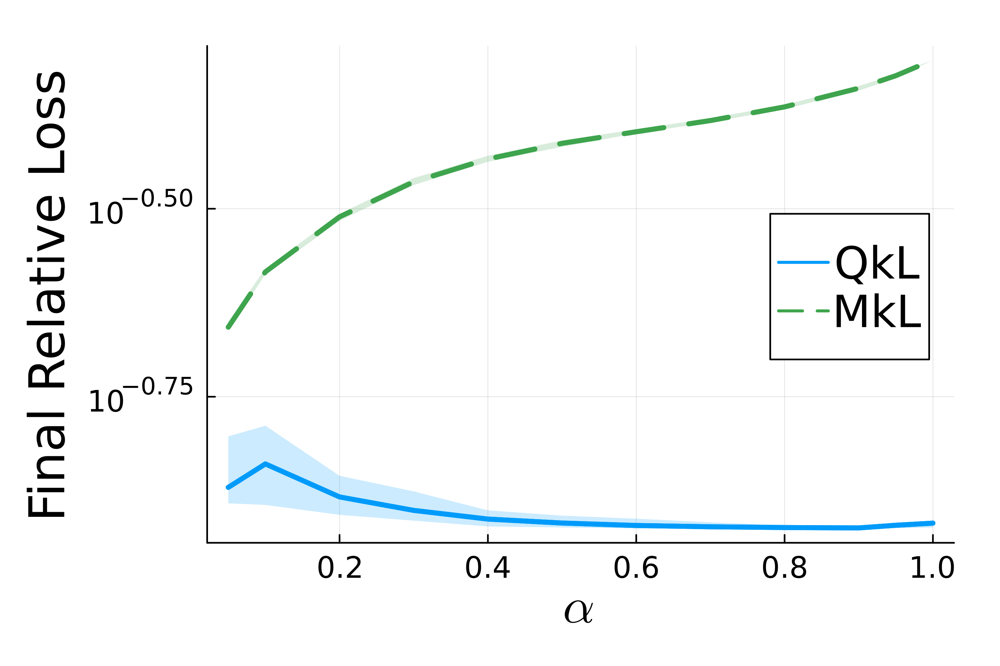

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_vs_alpha_5percoutlier.png"

In [38]:
p = plot(alphas, vec(mean(qkl_relative_losses, dims=1)), fillrange = vec(maximum(qkl_relative_losses, dims=1)), fillalpha = 0.2, label=nothing, xlabel=L"$\alpha$", ylabel="Final Relative Loss", lw=3, dpi=500,margin=5mm,color=1,legend=:right,yscale=:log10)
plot!(alphas, vec(mean(qkl_relative_losses, dims=1)), fillrange = vec(minimum(qkl_relative_losses, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=1,yscale=:log10)
plot!(alphas, vec(mean(mkl_relative_losses, dims=1)), fillrange = vec(maximum(mkl_relative_losses, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=3,linestyle=:dash,yscale=:log10)
plot!(alphas, vec(mean(mkl_relative_losses, dims=1)), fillrange = vec(minimum(mkl_relative_losses, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=3,linestyle=:dash,yscale=:log10)
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:solid, lw=0.8, color=1)
plot!([NaN], [NaN], label="MkL", linestyle=:dash, lw=0.8, color=3)

display(p)
savefig("figs/logisticregression_loss_vs_alpha_5percoutlier.png")

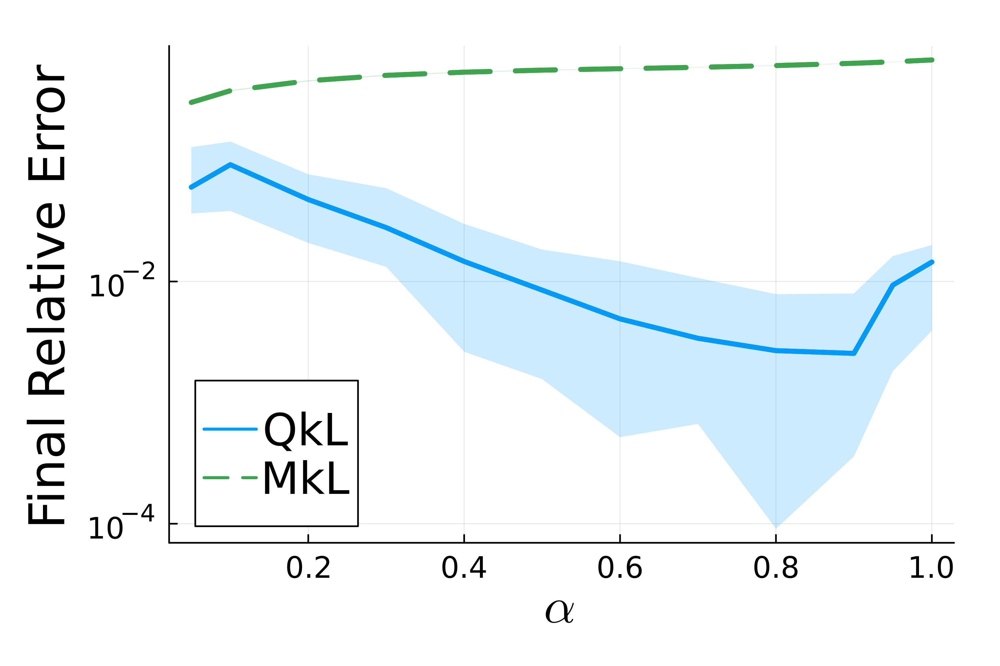

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_error_vs_alpha_5percoutlier.png"

In [39]:
p = plot(alphas, vec(mean(qkl_relative_errors, dims=1)), fillrange = vec(maximum(qkl_relative_errors, dims=1)), fillalpha = 0.2, label=nothing, xlabel=L"$\alpha$", ylabel="Final Relative Error", lw=3, dpi=500,margin=5mm,color=1,legend=:bottomleft,yscale=:log10)
plot!(alphas, vec(mean(qkl_relative_errors, dims=1)), fillrange = vec(minimum(qkl_relative_errors, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=1,yscale=:log10)
plot!(alphas, vec(mean(mkl_relative_errors, dims=1)), fillrange = vec(maximum(mkl_relative_errors, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=3,linestyle=:dash,yscale=:log10)
plot!(alphas, vec(mean(mkl_relative_errors, dims=1)), fillrange = vec(minimum(mkl_relative_errors, dims=1)), fillalpha = 0.2, label=nothing, lw=3, color=3,linestyle=:dash,yscale=:log10)
# Burner plots (only for legend, thin lines)
plot!([NaN], [NaN], label="QkL", linestyle=:solid, lw=0.8, color=1)
plot!([NaN], [NaN], label="MkL", linestyle=:dash, lw=0.8, color=3)

display(p)
savefig("figs/logisticregression_error_vs_alpha_5percoutlier.png")

# Quantile vs Final Relative Error

In [40]:
betas = [0.1, 0.2, 0.3, 0.4]
qs = 0.05:0.05:1.0

final_errs = zeros(length(betas), length(qs))
final_losses = zeros(length(betas), length(qs))

num_trials = 100

for (j,β) in enumerate(betas)
    # reset labels
	t = vcat(ones(class_size), zeros(class_size))  # Labels: 1 for positive, 0 for negative
	Oset = rand(1:Int(n_samples/2), Int(β*n_samples))  # Randomly select Oset indices
    t[Oset] .= 1 .- t[Oset]  # Flip labels
    Gset = setdiff(1:n_samples, Oset);  # Gset is the complement of Oset

    errs = zeros(num_trials, length(qs))
    losses = zeros(num_trials, length(qs))
    for trial = 1:num_trials
        for (i,q) in enumerate(qs)
            # Train model with QkL-SGD
            qklsgd_x, qkl_G_loss_hist, O_loss_hist, indices, O_allowed, qklsgd_error = qklsgd_logistic(x0, D_aug, t, n_samples, q, Gset, Oset, iters=10000, xstar = Gsgd_x)

            errs[trial, i] = qklsgd_error[end]/qklsgd_error[1]
            losses[trial, i] = qkl_G_loss_hist[end]/qkl_G_loss_hist[1]
        end
    end
    final_errs[j, :] = vec(mean(errs, dims=1))
    final_losses[j, :] = vec(mean(losses, dims=1))
end

(10,)(20,)(30,)(40,)(50,)(60,)(70,)(80,)(90,)(100,)(110,)(120,)(130,)(140,)(150,)(160,)(170,)(180,)(190,)(200,)(10,)(20,)(30,)(40,)(50,)(60,)(70,)(80,)(90,)(100,)(110,)(120,)(130,)(140,)(150,)(160,)(170,)(180,)(190,)(200,)(10,)(20,)(30,)(40,)(50,)(60,)(70,)(80,)(90,)(100,)(110,)(120,)(130,)(140,)(150,)(160,)(170,)(180,)(190,)(200,)(10,)(20,)(30,)(40,)(50,)(60,)(70,)(80,)(90,)(100,)(110,)(120,)(130,)(140,)(150,)(160,)(170,)(180,)(190,)(200,)(10,)(20,)(30,)(40,)(50,)(60,)(70,)(80,)(90,)(100,)(110,)(120,)(130,)(140,)(150,)(160,)(170,)(180,)(190,)(200,)(10,)(20,)(30,)(40,)(50,)(60,)(70,)(80,)(90,)(100,)(110,)(120,)(130,)(140,)(150,)(160,)(170,)(180,)(190,)(200,)(10,)(20,)(30,)(40,)(50,)(60,)(70,)(80,)(90,)(100,)(110,)(120,)(130,)(140,)(150,)(160,)(170,)(180,)(190,)(200,)(10,)(20,)(30,)(40,)(50,)(60,)(70,)(80,)(90,)(100,)(110,)(120,)(130,)(140,)(150,)(160,)(170,)(180,)(190,)(200,)(10,)(20,)(30,)(40,)(50,)(60,)(70,)(80,)(90,)(100,)(110,)(120,)(130,)(140,)(150,)(160,)(170,)(180,)(190,)(200,)(

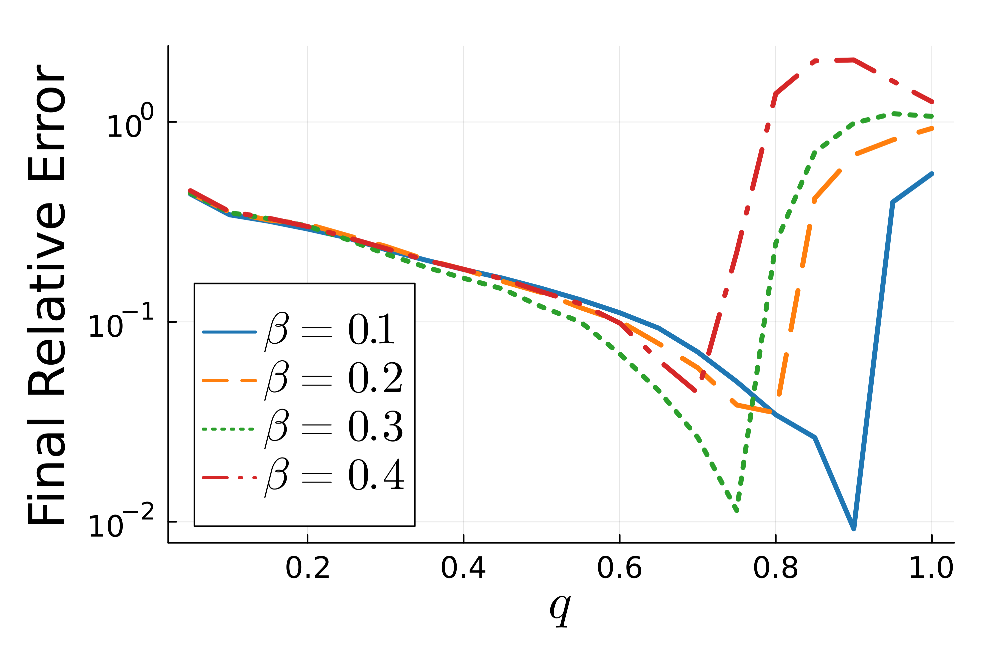

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_error_vs_q.png"

In [41]:
colors = palette(:tab10)
linestyles = [:solid, :dash, :dot, :dashdot]

p = plot(
    xlabel=L"q",
    ylabel="Final Relative Error",
    lw=3,
    dpi=500,
    margin=5mm,
    legend=:bottomleft,
)

for (j, beta) in enumerate(betas)
    plot!(
        qs,
        final_errs[j, :],
        color=colors[j],
        linestyle=linestyles[j],
        label=nothing,
        yscale=:log10,
        lw=3
    )
    # Burner plots (only for legend, thin lines)
    plot!([NaN], [NaN], 
        color=colors[j],
        linestyle=linestyles[j],
        label=L"\beta = %$(beta)",
        lw=0.8
    )
end

display(p)
savefig("figs/logisticregression_error_vs_q.png")

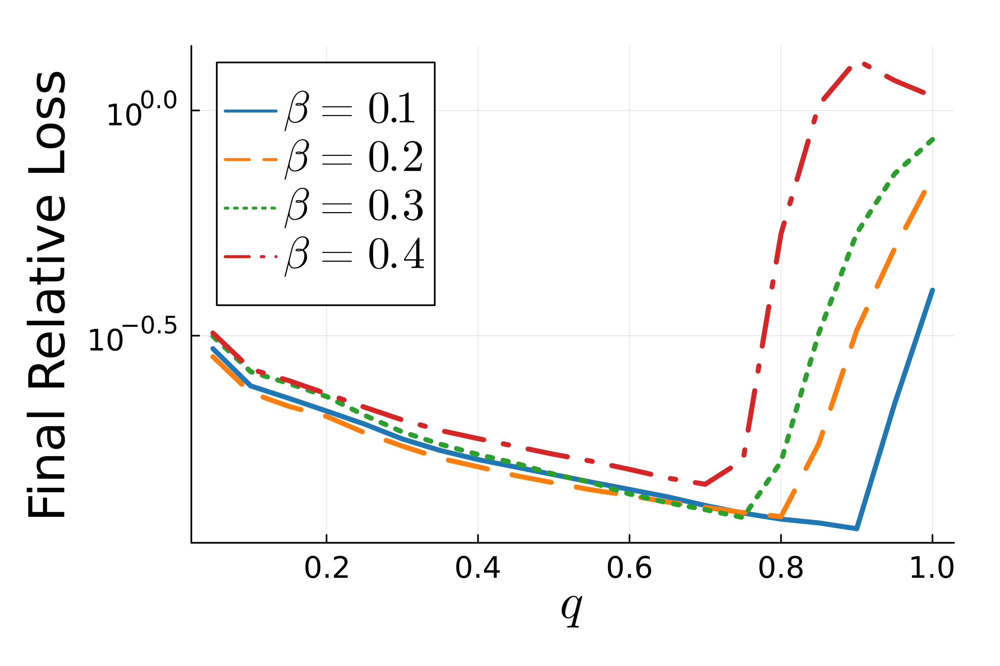

"/Users/jamiehaddock/Dropbox/RESEARCH/COLLAB CorruptSGD/code/JuliaCode/figs/logisticregression_loss_vs_q.png"

In [42]:
p = plot(
    xlabel=L"q",
    ylabel="Final Relative Loss",
    lw=3,
    dpi=500,
    margin=5mm,
    legend=:topleft,
)

for (j, beta) in enumerate(betas)
    plot!(
        qs,
        final_losses[j, :],
        color=colors[j],
        linestyle=linestyles[j],
        label=nothing,
        yscale=:log10,
        lw=3
    )
    # Burner plots (only for legend, thin lines)
    plot!([NaN], [NaN], 
        color=colors[j],
        linestyle=linestyles[j],
        label=L"\beta = %$(beta)",
        lw=0.8
    )
end

display(p)
savefig("figs/logisticregression_loss_vs_q.png")